In [1]:
#@title Define plotting utils

from bokeh.plotting import figure, show
from bokeh.io import output_notebook
from bokeh.layouts import column
from bokeh.models import ColumnDataSource, RangeTool
import numpy as np

from bokeh.models import Button
from bokeh.models.callbacks import CustomJS
from bokeh.layouts import row, column

output_notebook()

def plot_spikes(spikes, add_range_tool=False, x_range=None, width=800, height=400):
    """
    Plots an IrregularTimeSeries object defined by spikes.timestamps and spikes.unit_index.

    Parameters:
    spikes: An object containing 'timestamps' and 'unit_index' attributes.
    """
    if x_range is None:
        if add_range_tool:
            x_range = (spikes.timestamps[0] * 1e3, spikes.timestamps[0] * 1e3 + 20_000)
        else:
            x_range = (spikes.timestamps[0] * 1e3, spikes.timestamps[-1] * 1e3)

    # Create a figure
    p = figure(x_axis_label='Time', y_axis_label='Unit Index', width=width, height=height, x_axis_type="datetime", x_range=x_range, title="Spikes")

    # Prepare data for plotting
    x_values = spikes.timestamps * 1e3
    y_values = spikes.unit_index

    # Create a ColumnDataSource
    source = ColumnDataSource(data=dict(x=x_values, y=y_values))

    # Add scatter points to the plot
    p.scatter('x', 'y', source=source, size=5, color="navy", alpha=0.5, marker="dash", angle=np.pi/2)

    if add_range_tool:
        select = figure(height=height//5, width=width, tools="",
                        toolbar_location=None, background_fill_color="#efefef", x_axis_type="datetime",
                        title="Average Population Activity")
        select.xaxis.visible = False
        # select.yaxis.visible = False

        range_tool = RangeTool(x_range=p.x_range)
        range_tool.overlay.fill_color = "navy"
        range_tool.overlay.fill_alpha = 0.2

        spike_times_int = spikes.timestamps.astype(int)
        population_activity =np.bincount(spike_times_int-spike_times_int[0])
        source = ColumnDataSource(data=dict(x=(np.arange(len(population_activity)) + spike_times_int[0])* 1e3, y=population_activity))

        select.line('x', 'y', source=source)
        select.ygrid.grid_line_color = None
        select.add_tools(range_tool)
        p = column(select, p)

    return p

def plot_time_series(data, field, index=None, x_range=None, add_range_tool=False, y_axis_label=None, width=800, height=200, include_control_panel=False, shade_area_list=[]):
    # Create a figure
    if x_range is None:
        if add_range_tool:
            x_range = (data.timestamps[0] * 1e3, data.timestamps[0] * 1e3 + 20_000)
        else:
            x_range = (data.timestamps[0] * 1e3, data.timestamps[-1] * 1e3)

    if y_axis_label is None:
        y_axis_label = field

    p = figure(x_axis_label='Time', y_axis_label=y_axis_label, width=width, height=height, x_axis_type="datetime", x_range=x_range)


    domain_start = data.domain.start * 1e3
    domain_end = data.domain.end * 1e3
    # Prepare data for plotting
    x_values = data.timestamps * 1e3
    y_values = getattr(data, field)

    x_values = np.concatenate([x_values, domain_start, domain_end])
    y_values = np.concatenate([y_values, np.nan * np.ones((len(data.domain), * y_values.shape[1:])), np.nan * np.ones((len(data.domain), *y_values.shape[1:]))])

    # sort x_values and reorder y_values
    sort_indices = np.argsort(x_values)
    x_values = x_values[sort_indices]
    y_values = y_values[sort_indices]

    if y_values.ndim == 1:
        # Add a line to the plot
        source = ColumnDataSource(data=dict(x=x_values, y=y_values))
    elif y_values.ndim == 2:
        assert index is not None, "Index must be provided for 2D data"
        source = ColumnDataSource(data=dict(x=x_values, y=y_values[:, index]))
    else:
        raise ValueError(f"Field {field} has {y_values.ndim} dimensions, expected 1 or 2")

    p.line(x='x', y='y', source=source, line_width=2, color="green")
    x_range = p.x_range

    colors = ['red', 'blue', 'green', 'yellow', 'purple', 'orange', 'brown', 'pink', 'gray', 'black']
    for i, shade_area in enumerate(shade_area_list):
        start = shade_area.start * 1e3
        end = shade_area.end * 1e3
        rect_x = (start + end)/2
        rect_width = end - start
        rect_y = np.ones_like(start) * (y_values.min() + y_values.max())/2
        rect_height = np.ones_like(start) * (y_values.max() - y_values.min())
        p.rect(x=rect_x, y=rect_y, width=rect_width, height=rect_height, fill_color=colors[i], fill_alpha=0.4)
        # legend_items.append((f"Shade Area {i+1}", [p.renderers[-1]]))  # Add the rectangle to the legend items

    # p.legend.items = legend_items
    # p.legend.location = "top_left"  # Set the legend location
    # p.legend.click_policy = "hide"  # Allow clicking to hide the legend items

    if add_range_tool:
        select = figure(height=height//5, width=width, y_range=p.y_range, tools="",
                        toolbar_location=None, background_fill_color="#efefef", x_axis_type="datetime",)
        select.xaxis.visible = False
        select.yaxis.visible = False

        range_tool = RangeTool(x_range=p.x_range)
        range_tool.overlay.fill_color = "navy"
        range_tool.overlay.fill_alpha = 0.2

        select.line('x', 'y', source=source)
        select.ygrid.grid_line_color = None
        select.add_tools(range_tool)
        p = column(select, p)

        if include_control_panel:
            # Add a button to control the range tool
            play_button = Button(label="Play", button_type="success")
            pause_button = Button(label="Pause", button_type="warning")
            speed_buttons = [Button(label=f"{2**i}x", button_type="primary") for i in range(5)]

            # Create a shared ColumnDataSource to store the interval ID
            shared_data = ColumnDataSource(data=dict(interval_id=[None], step_size=[1000]))

            # Update the CustomJS to use the shared data source
            play_button.js_on_click(CustomJS(args=dict(range_tool=range_tool, x_values=x_values, shared_data=shared_data), code="""
                // Clear previous interval if it exists
                if (shared_data.data.interval_id[0]) {
                    clearInterval(shared_data.data.interval_id[0]);
                }

                // Create new interval and store it in the shared data
                let new_interval = setInterval(() => {
                    if (range_tool.x_range.end < x_values[x_values.length - 1]) {
                        range_tool.x_range.start += shared_data.data.step_size[0] / 10;
                        range_tool.x_range.end += shared_data.data.step_size[0] / 10;
                    } else {
                        clearInterval(shared_data.data.interval_id[0]);
                        shared_data.data.interval_id[0] = null;
                        shared_data.change.emit();
                    }
                }, 100);

                shared_data.data.interval_id[0] = new_interval;
                shared_data.change.emit();
            """));

            pause_button.js_on_click(CustomJS(args=dict(shared_data=shared_data), code="""
                if (shared_data.data.interval_id[0]) {
                    clearInterval(shared_data.data.interval_id[0]);
                    shared_data.data.interval_id[0] = null;
                    shared_data.change.emit();
                }
            """));

            for button in speed_buttons:
                button.js_on_click(CustomJS(args=dict(button=button, shared_data=shared_data), code="""
                    shared_data.data.step_size[0] = 1000 * parseInt(button.label.replace('x', ''));
                    shared_data.change.emit();
                """));

            # Add the buttons to the layout
            button_layout = row(play_button, pause_button, *speed_buttons)
            return p, x_range, button_layout

    return p


def plot_intervals(*interval, x_range=None, title=None, width=800, height=200):
    colors = ["red", "blue", "green", "yellow", "orange", "purple", "pink", "brown", "black"]
    # Create a figure
    if x_range is None:
      p = figure(title=title, x_axis_label='Time', y_axis_label='Intervals', y_range=(-len(interval), 1), width=width, height=height, x_axis_type="datetime",)
    else:
      p = figure(title=title, x_axis_label='Time', x_range=x_range, y_axis_label='Intervals', y_range=(-len(interval), 1), width=width, height=height, x_axis_type="datetime",)

    p.yaxis.visible = False

    for i in range(len(interval)):
        # Prepare data for plotting
        centers = (interval[i].start + interval[i].end) / 2.  * 1e3
        durations = (interval[i].end - interval[i].start)  * 1e3
        y_values = np.zeros_like(centers) - i  # y-values for the intervals

        # Create a ColumnDataSource
        source = ColumnDataSource(data=dict(x=centers, width=durations, y=y_values))

        # Add rectangles to the plot
        p.rect(x='x', y='y', width='width', height=0.8, source=source, fill_color=colors[i % 10], line_color="black", alpha=0.5)

    return p

def make_plot(data, add_play_controls=False):
    k = 'pos'
    include_control_panel = add_play_controls
    if include_control_panel:
      p_cursor_pos_x, x_range, button_layout = plot_time_series(data.cursor, k, y_axis_label='rat position', index=0, add_range_tool=include_control_panel, include_control_panel=include_control_panel, shade_area_list=[data.domain])
    else:
      p_cursor_pos_x = plot_time_series(data.cursor, k, y_axis_label='rat position', index=0, add_range_tool=include_control_panel, include_control_panel=include_control_panel, shade_area_list=[data.domain])
      x_range=p_cursor_pos_x.x_range

    # p_cursor_pos_y = plot_time_series(data.cursor, k, y_axis_label='cursor position y', index=1, add_range_tool=include_control_panel, x_range=x_range, shade_area_list=[data.reach_intervals])
    p_cursor_vel_x = plot_time_series(data.cursor, k, y_axis_label='cursor velocity x', index=0, add_range_tool=include_control_panel, x_range=x_range, ) # shade_area_list=[data.reach_intervals]
    # p_cursor_vel_y = plot_time_series(data.cursor, k, y_axis_label='cursor velocity y', index=1, add_range_tool=include_control_panel, x_range=x_range, shade_area_list=[data.reach_intervals])
    p_spikes = plot_spikes(data.spikes, add_range_tool=include_control_panel, x_range=x_range, height=480)
    print(x_range)
    p_reach_intervals = plot_intervals(data.reach_intervals, x_range=x_range, height=120, title="Reach intervals")

    if include_control_panel:
      return column(button_layout, row(p_spikes, column(p_reach_intervals, p_cursor_vel_x)))
    else:
      return row(p_spikes, column(p_reach_intervals, p_cursor_vel_x))


Loading BokehJS ...

In [85]:
import numpy as np
import matplotlib.pyplot as plt
import h5py

with h5py.File('D:/Pose/Neuro Code/data/NoveltySessInfoMatFiles/Achilles_10252013_sessInfo.mat', 'r') as f:
    print(f['sessInfo'].keys())
    print('epoch', f['sessInfo']['Epochs'].keys())
    print('position', f['sessInfo']['Position'].keys())
    print('spikes', f['sessInfo']['Spikes'].keys())

    ## load spike info
    spikes_times = np.array(f['sessInfo']['Spikes']['SpikeTimes'])[0];
    spikes_cells = np.array(f['sessInfo']['Spikes']['SpikeIDs'])[0];
    pyr_cells = np.array(f['sessInfo']['Spikes']['PyrIDs'])[0];
    print(spikes_times.shape)    
    print(spikes_cells.shape)    
    print('number of units', pyr_cells.shape)    
    # print(pyr_cells)    

    # ## load location info ## all in maze
    locations_2d = np.array(f['sessInfo']['Position']['TwoDLocation']).T;
    locations = np.array(f['sessInfo']['Position']['OneDLocation'])[0];
    locations_times = np.array(f['sessInfo']['Position']['TimeStamps'])[:,0];
    # linspeed_raw = np.array(f['sessInfo']['Position']['linspeed_raw'])[0];
    # linspeed_sm = np.array(f['sessInfo']['Position']['linspeed_sm'])[0];
    
    print(locations_2d.shape)
    print(locations.shape)
    print(locations_times.shape)
    # print(linspeed_raw.shape)
    # print(linspeed_sm.shape)


    # ## load maze epoch range
    maze_epoch = np.array(f['sessInfo']['Epochs']['MazeEpoch'])[:,0];
    wake_epoch = np.array(f['sessInfo']['Epochs']['Wake']);
    print(maze_epoch)
    print(wake_epoch)

<KeysViewHDF5 ['Epochs', 'Position', 'Spikes']>
epoch <KeysViewHDF5 ['Drowsy', 'Intermediate', 'MazeEpoch', 'NREM', 'POSTEpoch', 'PREEpoch', 'REM', 'Wake', 'sessDuration']>
position <KeysViewHDF5 ['MazeType', 'OneDLocation', 'TimeStamps', 'TwoDLocation']>
spikes <KeysViewHDF5 ['IntIDs', 'PyrIDs', 'SpikeIDs', 'SpikeTimes']>
(8414607,)
(8414607,)
number of units (120,)
(80762, 2)
(80762,)
(80762,)
[18079.5 20147. ]
[[  409.  1724.  2047.  2926.  7987. 12277. 18077. 19690. 20469. 22775.
  23411. 23977. 24429. 24692. 26648. 26989. 27339. 28540. 30571. 31487.]
 [  604.  1825.  2275.  3115.  8021. 12787. 19607. 20415. 20627. 23325.
  23567. 24188. 24588. 24895. 26928. 27007. 27451. 28640. 30753. 31544.]]


In [86]:
# "D:/Pose/Neuro Code/data/NoveltySessInfoMatFiles/Achilles_10252013_sessInfo.mat"

In [87]:
import numpy as np
import matplotlib.pyplot as plt
import h5py
# with h5py.File('/home/dz2336/Desktop/Research/Project/hdp/data/real/Achilles_10252013_eeg_theta_1.mat','r') as f:
#     tlfp = (f['TLFP'][()]);
#     tph = f['Tph'][()];

In [88]:
with h5py.File('D:/Pose/Neuro Code/data/NoveltySessInfoMatFiles/Achilles_10252013_sessInfo.mat', 'r') as f:
    print(f['sessInfo'].keys())
    print('epoch', f['sessInfo']['Epochs'].keys())
    print('position', f['sessInfo']['Position'].keys())
    print('spikes', f['sessInfo']['Spikes'].keys())

    ## load spike info
    spikes_times = np.array(f['sessInfo']['Spikes']['SpikeTimes'])[0];
    spikes_cells = np.array(f['sessInfo']['Spikes']['SpikeIDs'])[0];
    pyr_cells = np.array(f['sessInfo']['Spikes']['PyrIDs'])[0];
    print(spikes_times.shape)    
    print(spikes_cells.shape)    
    print(pyr_cells.shape)    
    # print(pyr_cells)    

    # ## load location info ## all in maze
    locations_2d = np.array(f['sessInfo']['Position']['TwoDLocation']).T;
    locations = np.array(f['sessInfo']['Position']['OneDLocation'])[0];
    locations_times = np.array(f['sessInfo']['Position']['TimeStamps'])[:,0];
    # linspeed_raw = np.array(f['sessInfo']['Position']['linspeed_raw'])[0];
    # linspeed_sm = np.array(f['sessInfo']['Position']['linspeed_sm'])[0];
    
    print(locations_2d.shape)
    print(locations.shape)
    print(locations_times.shape)
    # print(linspeed_raw.shape)
    # print(linspeed_sm.shape)


    # ## load maze epoch range
    maze_epoch = np.array(f['sessInfo']['Epochs']['MazeEpoch'])[:,0];
    wake_epoch = np.array(f['sessInfo']['Epochs']['Wake']);
    print(maze_epoch)
    print(wake_epoch)

<KeysViewHDF5 ['Epochs', 'Position', 'Spikes']>
epoch <KeysViewHDF5 ['Drowsy', 'Intermediate', 'MazeEpoch', 'NREM', 'POSTEpoch', 'PREEpoch', 'REM', 'Wake', 'sessDuration']>
position <KeysViewHDF5 ['MazeType', 'OneDLocation', 'TimeStamps', 'TwoDLocation']>
spikes <KeysViewHDF5 ['IntIDs', 'PyrIDs', 'SpikeIDs', 'SpikeTimes']>
(8414607,)
(8414607,)
(120,)
(80762, 2)
(80762,)
(80762,)
[18079.5 20147. ]
[[  409.  1724.  2047.  2926.  7987. 12277. 18077. 19690. 20469. 22775.
  23411. 23977. 24429. 24692. 26648. 26989. 27339. 28540. 30571. 31487.]
 [  604.  1825.  2275.  3115.  8021. 12787. 19607. 20415. 20627. 23325.
  23567. 24188. 24588. 24895. 26928. 27007. 27451. 28640. 30753. 31544.]]


In [89]:
time_in_maze = ((spikes_times >= maze_epoch[0])*(spikes_times <= maze_epoch[1]));
print(time_in_maze.shape)

spikes_times = spikes_times[time_in_maze];
spikes_cells = spikes_cells[time_in_maze];

cell_mask = np.isin(spikes_cells, pyr_cells);
spikes_times = spikes_times[cell_mask];
spikes_cells = spikes_cells[cell_mask];
print(spikes_times.shape)
print(spikes_cells.shape)

(8414607,)
(270829,)
(270829,)


In [90]:
spikes_times[111], spikes_cells[111], spikes_times[112], spikes_cells[112]

(18080.4612, 619.0, 18080.46195, 1039.0)

In [91]:
# bin_size = 25; ## change bin size to whatever you want here

# binned_spike_times = np.array(np.floor(spikes_times*1000/bin_size), dtype='int');
# spike_by_neuron = np.zeros((binned_spike_times.max() - binned_spike_times.min()+1, pyr_cells.shape[0]));
# binned_spike_times.shape, spike_by_neuron.shape, 

In [92]:
# binned_spike_times[111], spikes_cells[111], binned_spike_times[112], spikes_cells[112]

In [93]:

cell_dic = {};
for i,v in enumerate(pyr_cells):
    cell_dic[int(v)] = i;
cell_dic

{102: 0,
 107: 1,
 108: 2,
 110: 3,
 112: 4,
 113: 5,
 114: 6,
 117: 7,
 122: 8,
 123: 9,
 124: 10,
 128: 11,
 129: 12,
 130: 13,
 205: 14,
 305: 15,
 403: 16,
 405: 17,
 412: 18,
 413: 19,
 414: 20,
 415: 21,
 416: 22,
 417: 23,
 418: 24,
 419: 25,
 420: 26,
 421: 27,
 422: 28,
 510: 29,
 514: 30,
 516: 31,
 518: 32,
 519: 33,
 522: 34,
 524: 35,
 526: 36,
 527: 37,
 529: 38,
 530: 39,
 532: 40,
 533: 41,
 534: 42,
 535: 43,
 536: 44,
 538: 45,
 603: 46,
 605: 47,
 611: 48,
 612: 49,
 613: 50,
 614: 51,
 615: 52,
 616: 53,
 618: 54,
 619: 55,
 620: 56,
 802: 57,
 803: 58,
 805: 59,
 807: 60,
 808: 61,
 811: 62,
 819: 63,
 825: 64,
 826: 65,
 827: 66,
 828: 67,
 829: 68,
 830: 69,
 903: 70,
 913: 71,
 915: 72,
 921: 73,
 923: 74,
 924: 75,
 925: 76,
 927: 77,
 928: 78,
 929: 79,
 931: 80,
 932: 81,
 933: 82,
 934: 83,
 935: 84,
 1004: 85,
 1019: 86,
 1020: 87,
 1021: 88,
 1022: 89,
 1028: 90,
 1029: 91,
 1033: 92,
 1034: 93,
 1035: 94,
 1037: 95,
 1038: 96,
 1039: 97,
 1040: 98,
 1102:

In [94]:
spike_unit_index = np.zeros_like(spikes_cells)

for it in range(spikes_cells.shape[0]):
    spike_unit_index[it] = cell_dic[spikes_cells[it]]
    

In [95]:
spikes_times.shape, spike_unit_index.shape, spikes_times[111], spike_unit_index[111]

((270829,), (270829,), 18080.4612, 55.0)

In [96]:
import numpy as np
from temporaldata import ArrayDict, IrregularTimeSeries

# create the IrregularTimeSeries object
spikes = IrregularTimeSeries(
    timestamps=spikes_times,
    unit_index=spike_unit_index,
    domain="auto",
)
# sort the spikes by timestamps
spikes.sort()

print(f"Number of spikes: {len(spikes)}")
print(f"spikes={spikes}")

Number of spikes: 270829
spikes=IrregularTimeSeries(
  timestamps=[270829],
  unit_index=[270829]
)


In [97]:
fig = plot_spikes(spikes, width=1200)
show(fig)

In [98]:
# Assuming you dont remove nans 
# locations, locations_times

diffs = []
for i in range(len(locations_times)-1):
    diffs.append(1/(locations_times[i+1]-locations_times[i]))
diffs = np.array(diffs)

In [99]:
sampling_rate = np.median(diffs)
diffs.mean(), diffs.min(), diffs.max(), diffs.max() - diffs.min(), np.median(diffs)

(39.0626360338573,
 39.06263602925305,
 39.06263603480421,
 5.551157755689928e-09,
 39.06263603480421)

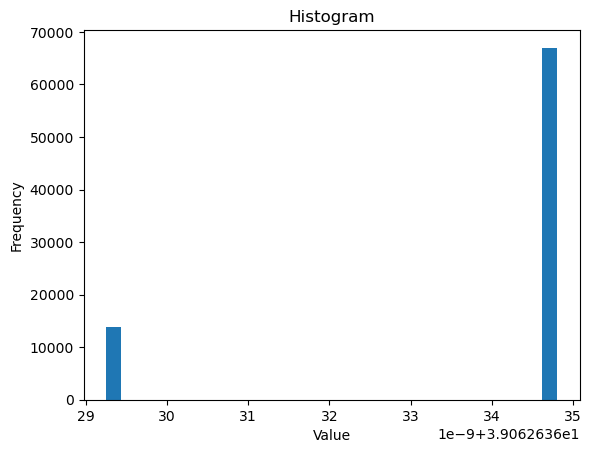

In [100]:
plt.hist(diffs, bins=30)
plt.xlabel("Value")
plt.ylabel("Frequency")
plt.title("Histogram")
plt.show()

In [101]:
1/0.025599910848541185

39.06263603480421

In [102]:
locations.shape, locations[0], locations_times.shape, locations_times[0], 

((80762,), nan, (80762,), 18079.5)

In [103]:
assert np.allclose(np.diff(locations_times), 1/sampling_rate)

In [104]:
from temporaldata import RegularTimeSeries

cursor = RegularTimeSeries(
    pos=locations,
    sampling_rate=sampling_rate,
    domain_start=locations_times[0],
    domain="auto",
)

In [105]:
fig = plot_time_series(cursor, field="pos", index=0, width=1200)
show(fig)

In [106]:
wake_epoch, maze_epoch

t_min = maze_epoch[0]
t_max = maze_epoch[1]

mask = (wake_epoch[0, :] > t_min) & (wake_epoch[0, :] < t_max)

filtered = wake_epoch[:, mask]

print(wake_epoch)
print(filtered)
maze_epoch

[[  409.  1724.  2047.  2926.  7987. 12277. 18077. 19690. 20469. 22775.
  23411. 23977. 24429. 24692. 26648. 26989. 27339. 28540. 30571. 31487.]
 [  604.  1825.  2275.  3115.  8021. 12787. 19607. 20415. 20627. 23325.
  23567. 24188. 24588. 24895. 26928. 27007. 27451. 28640. 30753. 31544.]]
[[19690.]
 [20415.]]


array([18079.5, 20147. ])

In [107]:
from temporaldata import Interval

reach_intervals = Interval(
    start=filtered[0, :],
    end=filtered[1, :],
)

In [108]:
fig = plot_intervals(reach_intervals, width=1200)
show(fig)

In [109]:
from temporaldata import Data

data = Data(
    spikes=spikes,
    # units=units,
    cursor=cursor.to_irregular(),
    domain="auto",
    # add metadata
    brainset=Data(id="hippo_rat"),
    session=Data(id="hippo_a"),
    reach_intervals=reach_intervals,
)

print(data)

Data(
spikes=IrregularTimeSeries(
  timestamps=[270829],
  unit_index=[270829]
),
cursor=IrregularTimeSeries(
  timestamps=[80762],
  pos=[80762]
),
brainset=Data(
id='hippo_rat',
),
session=Data(
id='hippo_a',
),
reach_intervals=Interval(
  start=[1],
  end=[1]
),
)


In [110]:
show(make_plot(data, add_play_controls=True))

Range1d(id='p4296', ...)


In [45]:
spikes_times[0], locations_times[0]

(18079.5065, 18079.5)

In [111]:
non_na = ~np.isnan(locations)
np.array(~np.isnan(locations)).sum(), np.array(np.isnan(locations)).sum(), np.array(~np.isnan(locations_times)).sum()

(10336, 70426, 80762)

In [13]:
binned_locations_times = binned_locations_times[non_na];
locations = locations[non_na];
#locations_2d = locations_2d[non_na];

In [ ]:
non_na = (~np.isnan(linspeed_raw));
binned_locations_times = binned_locations_times[non_na];
locations = locations[non_na];
linspeed_raw = linspeed_raw[non_na];
linspeed_sm = linspeed_sm[non_na];
#locations_2d = locations_2d[non_na];

In [14]:
locations.shape, locations_times.shape

((10336,), (80762,))

In [15]:
locations_vec = np.zeros(spike_by_neuron.shape[0])+np.nan;
linspeed_vec = np.zeros(spike_by_neuron.shape[0])+np.nan;
locations_vec.shape, linspeed_vec.shape

((82700,), (82700,))

In [16]:
for it in range(len(binned_locations_times)):
    locations_vec[binned_locations_times[it] - binned_spike_times.min()] = locations[it];
    # linspeed_vec[binned_locations_times[it] - binned_spike_times.min()] = linspeed_raw[it];
    

In [17]:
locations_vec.shape

(82700,)

In [18]:
spike_by_neuron_use = spike_by_neuron[~np.isnan(locations_vec)];
locations_vec = locations_vec[~np.isnan(locations_vec)];
# tph_vec = tph_vec[~np.isnan(linspeed_vec)]
# tlpf_vec = tlpf_vec[~np.isnan(linspeed_vec)]
# linspeed_vec = linspeed_vec[~np.isnan(linspeed_vec)];


def rolling_max(x):
    idx_split = [];
    
    for idx, val in enumerate(x):
        if val < 0.025 or val > 1.575:
            tmp = x[max(idx-20,0):min(idx+20,len(x))];
            if val == min(tmp) or val==max(tmp):
                idx_split.append(idx)
    idx_split = np.array(idx_split)
    return idx_split

idx_split = rolling_max(locations_vec)
idx_split = np.delete(idx_split, np.where(np.abs(np.diff(locations_vec[idx_split])) < 1)[0])


# ## save data
# sio.savemat("../data/achilles_data/Achilles_data.mat",
#             {'trial':idx_split, 'spikes':spike_by_neuron_use, 'loc':locations_vec, 'lfp':tlpf_vec})

In [22]:
spike_by_neuron_use.shape, locations_vec.shape, locations_vec[111]

((10336, 120), (10336,), 0.5385954805936742)

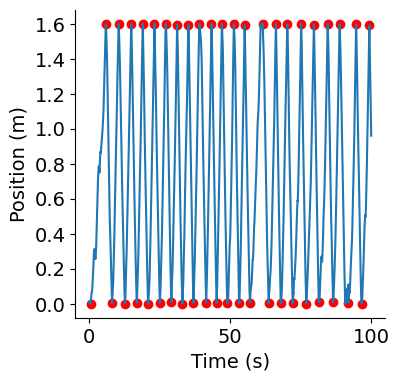

In [19]:

from matplotlib.ticker import FormatStrFormatter
## check if you have removed all the stop stages

fig = plt.figure(figsize=(4,4))
ax1 = plt.subplot(111);
fsz = 14;
ll = 4000
plt.plot(locations_vec[:ll])
ax1.set_xlabel('Time (s)',fontsize=fsz,fontweight='normal');
ax1.set_ylabel('Position (m)',fontsize=fsz,fontweight='normal');
ax1.spines['top'].set_visible(False)
ax1.spines['right'].set_visible(False)
plt.setp(ax1.get_xticklabels(), fontsize=fsz);
plt.setp(ax1.get_yticklabels(), fontsize=fsz);
ax1.set_xticks((0,2000,4000,6000));
ax1.set_xticklabels((0,50,100,150));
#ax1.set_xticks((0,2000,4000,6000,8000,10000))
#ax1.set_xticklabels((0,50,100,150,200,250))
ax1.yaxis.set_major_formatter(FormatStrFormatter('%.1f'))
plt.scatter(idx_split[idx_split<ll], locations_vec[idx_split[idx_split<ll]], c='red')

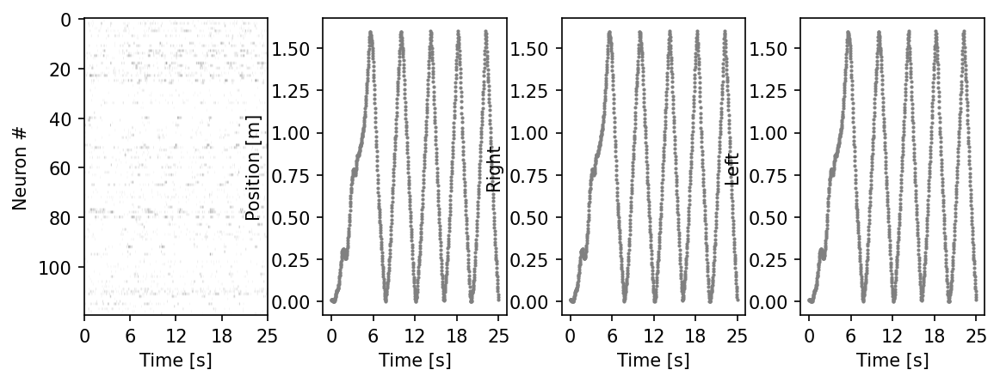

In [23]:
import matplotlib.pyplot as plt 

fig = plt.figure(figsize=(9,3), dpi=150)
plt.subplots_adjust(wspace = 0.3)
ax = plt.subplot(141)
ax.imshow(spike_by_neuron_use[:1000].T, aspect = 'auto', cmap = 'gray_r')
plt.ylabel('Neuron #')
plt.xlabel('Time [s]')
plt.xticks(np.linspace(0, 1000, 5), np.linspace(0, 0.025*1000, 5, dtype = int))

ax2 = plt.subplot(142)
ax2.scatter(np.arange(1000), locations_vec[:1000], c = 'gray', s=1)
plt.ylabel('Position [m]')
plt.xlabel('Time [s]')
plt.xticks(np.linspace(0, 1000, 5), np.linspace(0, 0.025*1000, 5, dtype = int))

ax2 = plt.subplot(143)
ax2.scatter(np.arange(1000), locations_vec[:1000], c = 'gray', s=1)
plt.ylabel('Right')
plt.xlabel('Time [s]')
plt.xticks(np.linspace(0, 1000, 5), np.linspace(0, 0.025*1000, 5, dtype = int))

ax2 = plt.subplot(144)
ax2.scatter(np.arange(1000), locations_vec[:1000], c = 'gray', s=1)
plt.ylabel('Left')
plt.xlabel('Time [s]')
plt.xticks(np.linspace(0, 1000, 5), np.linspace(0, 0.025*1000, 5, dtype = int))

plt.show()

# plt.savefig('raw_data.png')
# plt.clf()


# With Filtering

I asked you something about filtering some arrays and you gave me a code. the conversation is now deleted. i wanna explain it to you again, send the code you sent me and change some part of the code. SO we have 4 arrays. two of them are called spikes_times and spikes_cells. they are both of shape [N,]. the i-th element in spike_times is the time stamp for an event that happened, and it corresponds to unit it in spike_cells[i]. the spike_times is event based so intervales vary. also its sorted and has no Nan values. The other two are called locations and locations_times. these are recorded from movement of an animal. the location_times are timestamps that has somewhat of a constant interval (39 Hz). the location value is the corresponding location on that time. the thing is, the location value is sometimes Nan. i wanna remove these times. i wanna remove these times from the spike arrays as well, as the  time is shared between them. you gave me this code: 
```import numpy as np

# --- Step 1: valid location intervals ---
valid_loc_mask = ~np.isnan(locations)
valid_intervals = valid_loc_mask[:-1]

# --- Step 2: assign spikes to intervals ---
interval_indices = np.searchsorted(locations_times, spikes_times, side='right') - 1

# --- Step 3: create mask safely ---
valid_spike_mask = (
    (interval_indices >= 0) &
    (interval_indices < len(valid_intervals))
)

# Only check validity for spikes inside bounds
valid_spike_mask[valid_spike_mask] &= \
    valid_intervals[interval_indices[valid_spike_mask]]

# --- Step 4: filter ---
filtered_spike_time = spikes_times[valid_spike_mask]
filtered_spike_id = spikes_cells[valid_spike_mask]

filtered_location_time = locations_times[valid_loc_mask]
filtered_locations = locations[valid_loc_mask]
```
The problem with this code is that for intervals that are omitted (have nan in location), i want to update the timestamps of both arrays as well. meaning that if a time period is omitted, i wanna change the following timestamps in array accordingly

In [13]:
# Dont bin the data
# store as event based
# show the data like the BOKEH page
# Convert to POYO shit 

import numpy as np
import matplotlib.pyplot as plt
import h5py
# with h5py.File('/home/dz2336/Desktop/Research/Project/hdp/data/real/Achilles_10252013_eeg_theta_1.mat','r') as f:
#     tlfp = (f['TLFP'][()]);
#     tph = f['Tph'][()];

with h5py.File('D:/Pose/Neuro Code/data/NoveltySessInfoMatFiles/Achilles_10252013_sessInfo.mat', 'r') as f:
    ## load spike info
    spikes_times = np.array(f['sessInfo']['Spikes']['SpikeTimes'])[0];
    spikes_cells = np.array(f['sessInfo']['Spikes']['SpikeIDs'])[0];
    pyr_cells = np.array(f['sessInfo']['Spikes']['PyrIDs'])[0];
    
    ## load location info ## all in maze
    locations_2d = np.array(f['sessInfo']['Position']['TwoDLocation']).T;
    locations = np.array(f['sessInfo']['Position']['OneDLocation'])[0];
    locations_times = np.array(f['sessInfo']['Position']['TimeStamps'])[:,0];
    # linspeed_raw = np.array(f['sessInfo']['Position']['linspeed_raw'])[0];
    # linspeed_sm = np.array(f['sessInfo']['Position']['linspeed_sm'])[0];
    
    ## load maze epoch range
    maze_epoch = np.array(f['sessInfo']['Epochs']['MazeEpoch'])[:,0];
    wake_epoch = np.array(f['sessInfo']['Epochs']['Wake']);
    
time_in_maze = ((spikes_times >= maze_epoch[0])*(spikes_times <= maze_epoch[1]));

spikes_times = spikes_times[time_in_maze];
spikes_cells = spikes_cells[time_in_maze];

cell_mask = np.isin(spikes_cells, pyr_cells);
spikes_times = spikes_times[cell_mask];
spikes_cells = spikes_cells[cell_mask];

cell_dic = {};
for i,v in enumerate(pyr_cells):
    cell_dic[int(v)] = i;
 
# tph_binned_time = np.array(np.floor((np.arange(binned_spike_times.min(),binned_spike_times.max()+1)*bin_size/1000)*1250), dtype='int');
# tph_vec = tph[0][tph_binned_time]
# tlpf_vec = tlfp[0][tph_binned_time]

# locations
# locations_times
# spikes_times
# spikes_cells
import numpy as np

# locations_times: shape (M,), strictly increasing
# locations:       shape (M,)
# spikes_times:    shape (N,), sorted, no NaNs
# spikes_cells:    shape (N,)

# --- Step 0: masks and interval validity ---
valid_loc_mask = ~np.isnan(locations)          # per-sample validity (M,)
valid_intervals = valid_loc_mask[:-1]          # per-interval validity (M-1,)
# If you prefer requiring BOTH endpoints valid, use:
# valid_intervals = valid_loc_mask[:-1] & valid_loc_mask[1:]

# --- Step 1: compute how much time is "removed" up to each location sample ---
dt = np.diff(locations_times)                  # (M-1,)
removed_dt = dt * (~valid_intervals)           # (M-1,) durations to remove
cum_removed = np.concatenate([[0.0], np.cumsum(removed_dt)])  # (M,)

# For a time t in interval i = [t_i, t_{i+1}), subtract cum_removed[i]

# --- Step 2: assign each spike to a location interval index ---
interval_idx = np.searchsorted(locations_times, spikes_times, side="right") - 1

# --- Step 3: keep only spikes that land in a valid, in-range interval ---
in_range = (interval_idx >= 0) & (interval_idx < len(valid_intervals))
keep_spikes = in_range.copy()
keep_spikes[in_range] &= valid_intervals[interval_idx[in_range]]

# --- Step 4: remap (shift) spike timestamps to "gap-closed" time ---
filtered_spike_time = spikes_times[keep_spikes] - cum_removed[interval_idx[keep_spikes]]
filtered_spike_id   = spikes_cells[keep_spikes]

# --- Step 5: filter + remap location samples too ---
filtered_locations = locations[valid_loc_mask]
filtered_location_time = locations_times[valid_loc_mask] - cum_removed[valid_loc_mask]

# -------------------------------------------------------------------
# NEW Step 6: drop spikes earlier than the first valid location time
# -------------------------------------------------------------------
t0_loc = filtered_location_time[0]   # first valid location time in gap-closed timeline
eps = 1e-12                          # tiny tolerance for float comparisons

keep2 = filtered_spike_time >= (t0_loc - eps)
filtered_spike_time = filtered_spike_time[keep2]
filtered_spike_id   = filtered_spike_id[keep2]

# -------------------------------------------------------------------
# NEW Step 7: shift everything so the timeline starts at 0
# -------------------------------------------------------------------
filtered_location_time = filtered_location_time - t0_loc
filtered_spike_time    = filtered_spike_time - t0_loc

In [14]:
print(filtered_spike_time.shape, filtered_spike_time[0], filtered_spike_time[-1])
print(filtered_location_time.shape, filtered_location_time[0], filtered_location_time[-1], filtered_location_time[-1] - filtered_location_time[0])
print(filtered_locations.shape, filtered_locations[0], filtered_locations[-1])

(55634,) 0.004088073597813491 264.59891543178674
(10336,) 0.0 264.5750786261124 264.5750786261124
(10336,) 0.005800072934626944 0.005944937172943969


In [15]:
spike_unit_index = np.zeros_like(filtered_spike_id)

for it in range(filtered_spike_id.shape[0]):
    spike_unit_index[it] = cell_dic[filtered_spike_id[it]]


In [16]:
import numpy as np
from temporaldata import ArrayDict, IrregularTimeSeries

# create the IrregularTimeSeries object
spikes = IrregularTimeSeries(
    timestamps=filtered_spike_time,
    unit_index=spike_unit_index,
    domain="auto",
)
# sort the spikes by timestamps
spikes.sort()

print(f"Number of spikes: {len(spikes)}")
print(f"spikes={spikes}")

fig = plot_spikes(spikes, width=1200)
show(fig)

Number of spikes: 55634
spikes=IrregularTimeSeries(
  timestamps=[55634],
  unit_index=[55634]
)


In [17]:
sampling_rate = 39.06263603480421

from temporaldata import RegularTimeSeries

cursor = RegularTimeSeries(
    pos=filtered_locations,
    sampling_rate=sampling_rate,
    domain_start=filtered_location_time[0],
    domain="auto",
)
fig = plot_time_series(cursor, field="pos", index=0, width=1200)
show(fig)

In [18]:
from temporaldata import Interval

wake_epoch, maze_epoch

t_min = maze_epoch[0]
t_max = maze_epoch[1]

mask = (wake_epoch[0, :] > t_min) & (wake_epoch[0, :] < t_max)

filtered = wake_epoch[:, mask]

print(wake_epoch)
print(filtered)
maze_epoch

reach_intervals = Interval(
    start=filtered[0, :],
    end=filtered[1, :],
)
fig = plot_intervals(reach_intervals, width=1200)
show(fig)

[[  409.  1724.  2047.  2926.  7987. 12277. 18077. 19690. 20469. 22775.
  23411. 23977. 24429. 24692. 26648. 26989. 27339. 28540. 30571. 31487.]
 [  604.  1825.  2275.  3115.  8021. 12787. 19607. 20415. 20627. 23325.
  23567. 24188. 24588. 24895. 26928. 27007. 27451. 28640. 30753. 31544.]]
[[19690.]
 [20415.]]


In [19]:
from temporaldata import Data

data = Data(
    spikes=spikes,
    # units=units,
    cursor=cursor.to_irregular(),
    domain="auto",
    # add metadata
    brainset=Data(id="hippo_rat"),
    session=Data(id="hippo_a"),
    reach_intervals=reach_intervals,
)

print(data)
show(make_plot(data, add_play_controls=True))

Data(
spikes=IrregularTimeSeries(
  timestamps=[55634],
  unit_index=[55634]
),
cursor=IrregularTimeSeries(
  timestamps=[10336],
  pos=[10336]
),
brainset=Data(
id='hippo_rat',
),
session=Data(
id='hippo_a',
),
reach_intervals=Interval(
  start=[1],
  end=[1]
),
)
Range1d(id='p1825', ...)


In [20]:

print(filtered_spike_time.shape, filtered_spike_time[0], filtered_spike_time[-1])
print(filtered_location_time.shape, filtered_location_time[0], filtered_location_time[-1])
print(filtered_locations.shape, filtered_locations[0], filtered_locations[-1])

(55634,) 0.004088073597813491 264.59891543178674
(10336,) 0.0 264.5750786261124
(10336,) 0.005800072934626944 0.005944937172943969


In [21]:
filtered_spike_time, filtered_location_time

(array([4.08807360e-03, 5.23807360e-03, 1.89880736e-02, ...,
        2.64585915e+02, 2.64591765e+02, 2.64598915e+02]),
 array([0.00000000e+00, 2.55999108e-02, 5.11998217e-02, ...,
        2.64523879e+02, 2.64549479e+02, 2.64575079e+02]))

In [22]:
spikes_sliced = spikes.slice(start=0., end=10.)

print(f"Before slicing:\nspikes={spikes}")
print(f"After slicing:\nspikes_sliced={spikes_sliced}")

Before slicing:
spikes=IrregularTimeSeries(
  timestamps=[55634],
  unit_index=[55634]
)
After slicing:
spikes_sliced=IrregularTimeSeries(
  timestamps=[2321],
  unit_index=[2321]
)


In [23]:
fig = plot_spikes(spikes_sliced, width=1200)
fig.title = f"Spikes between {spikes_sliced.domain.start[0]}s and {spikes_sliced.domain.end[0]}s"
show(fig)

In [24]:
data_sliced = data.slice(start=20., end=100.)

print(f"Before slicing:\ndata={data}\n")
print(f"After slicing:\ndata_sliced={data_sliced}")

Before slicing:
data=Data(
spikes=IrregularTimeSeries(
  timestamps=[55634],
  unit_index=[55634]
),
cursor=IrregularTimeSeries(
  timestamps=[10336],
  pos=[10336]
),
brainset=Data(
id='hippo_rat',
),
session=Data(
id='hippo_a',
),
reach_intervals=Interval(
  start=[1],
  end=[1]
),
)

After slicing:
data_sliced=Data(
spikes=IrregularTimeSeries(
  timestamps=[18768],
  unit_index=[18768]
),
cursor=IrregularTimeSeries(
  timestamps=[3125],
  pos=[3125]
),
brainset=Data(
id='hippo_rat',
),
session=Data(
id='hippo_a',
),
reach_intervals=Interval(
  start=[0],
  end=[0]
),
_absolute_start=20.0,
)


In [25]:
show(make_plot(data_sliced))

Range1d(id='p2333', ...)
